In [ ]:
!pip install pandas numpy networkx matplotlib scikit-learn nltk wordcloud
!pip install ogb

In [1]:
import pandas as pd 
import numpy as np

df = pd.read_csv('./dataset/raw/edges.csv', header=None, skiprows=1).drop_duplicates()
df = df.sort_values(by=0)
edge_list = df.values.tolist()

lb = pd.read_csv('./dataset/raw/node_labels.csv', header=None, skiprows=1)
label_list = lb[0].tolist()

ft = pd.read_csv('./dataset/raw/reduced_features_strict.csv', header=None, skiprows=1)
node_features = ft.to_numpy()

In [ ]:
# Explore smoothness of the graph

Shape of node features: (222769, 128)
Number of nodes: 222769
Number of edges: 1591149
Shape of adjacency matrix: (222769, 222769)
Graph Smoothness Analysis Results:

Feature Smoothness:
Mean: 0.7692
Std: 0.1020

Label Smoothness: 0.3283

Local Smoothness:
Mean: 25.3275
Std: 4.7954

Graph Statistics:
num_nodes: 222769.0000
num_edges: 1588800.0000
avg_degree: 14.2641
clustering_coefficient: 0.2061


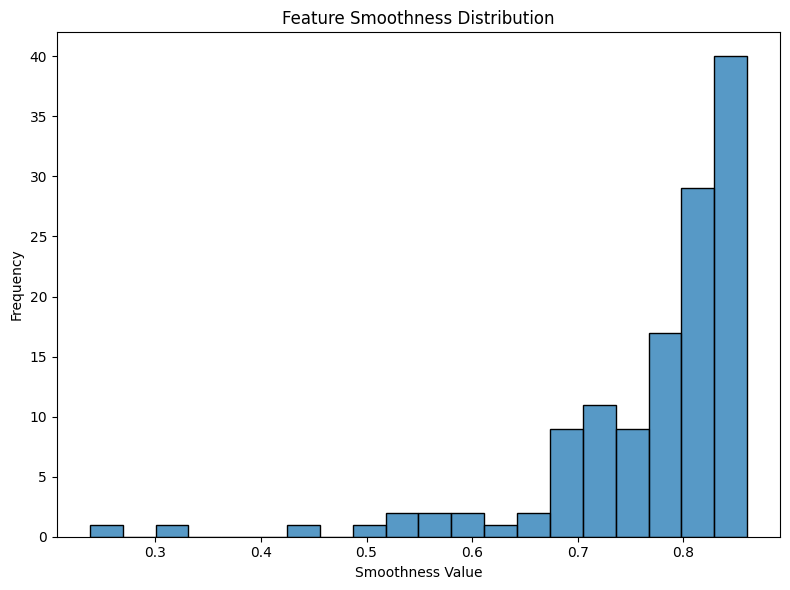

In [2]:
import networkx as nx
from scipy import sparse
import matplotlib.pyplot as plt
import seaborn as sns

def analyze_graph_smoothness(edges, node_features, node_labels):
    # Get total number of nodes from node features
    num_nodes = len(node_labels)
    X = node_features
    print('Shape of node features:', X.shape)
    y = node_labels
    print('Number of nodes:', num_nodes)
    
    # Create graph with all nodes first
    G = nx.Graph()
    G.add_nodes_from(range(num_nodes))  # Add all nodes first
    G.add_edges_from(edges)             # Add edges
    print('Number of edges:', len(edges))
    
    # Verify node count
    assert G.number_of_nodes() == num_nodes, "Graph node count doesn't match feature count"
    
    # Get adjacency matrix of the graph
    A = nx.adjacency_matrix(G)
    print('Shape of adjacency matrix:', A.shape)
    
    # Calculate degree matrix (handling isolated nodes)
    degrees = np.array(A.sum(axis=1)).flatten()
    # Add small epsilon to avoid division by zero for isolated nodes
    epsilon = 1e-10
    degrees = degrees + epsilon
    D = sparse.diags(degrees)
    
    # Calculate normalized Laplacian
    D_inv_sqrt = sparse.diags(1.0 / np.sqrt(degrees))
    L_norm = sparse.eye(num_nodes) - D_inv_sqrt @ A @ D_inv_sqrt
    
    # Calculate feature smoothness
    def calculate_feature_smoothness(x):
        """Calculate smoothness for a single feature vector"""
        return (x.T @ L_norm @ x) / (x.T @ x)
    
    feature_smoothness = np.array([calculate_feature_smoothness(np.array(X[:, i])) 
                                 for i in range(X.shape[1])])
    
    # Calculate label smoothness if labels are available
    label_smoothness = calculate_feature_smoothness(y)
    
    # Calculate local smoothness (feature difference between neighbors)
    def calculate_local_smoothness():
        local_smooth = []
        for u, v in G.edges():
            diff = np.linalg.norm(X[u] - X[v])
            local_smooth.append(diff)
        return np.array(local_smooth)
    
    local_smoothness = calculate_local_smoothness()
    
    # Calculate graph statistics
    avg_degree = np.mean(degrees)
    clustering_coeff = nx.average_clustering(G)
    
    # Prepare results
    results = {
        'feature_smoothness': {
            'mean': np.mean(feature_smoothness),
            'std': np.std(feature_smoothness),
            'per_feature': feature_smoothness
        },
        'label_smoothness': label_smoothness,
        'local_smoothness': {
            'mean': np.mean(local_smoothness),
            'std': np.std(local_smoothness),
            'max': np.max(local_smoothness),
            'min': np.min(local_smoothness)
        },
        'graph_statistics': {
            'num_nodes': G.number_of_nodes(),
            'num_edges': G.number_of_edges(),
            'avg_degree': avg_degree,
            'clustering_coefficient': clustering_coeff
        }
    }
    
    return results, G

def plot_smoothness_distribution(results, G):
    plt.figure(figsize=(8,6))
    
    # Plot feature smoothness distribution
    sns.histplot(data=results['feature_smoothness']['per_feature'], bins=20)
    plt.title('Feature Smoothness Distribution')
    plt.xlabel('Smoothness Value')
    plt.ylabel('Frequency')
    
    plt.tight_layout()
    plt.show()


# Analyze the graph
edge_tuple_list = []
for row in edge_list:
    edge = (row[0], row[1])
    edge_tuple_list.append(edge)
edges = np.array(edge_list)
features = np.array(node_features)
labels = np.array(label_list)
results, G = analyze_graph_smoothness(edges, features, labels)

# Print summary statistics
print("Graph Smoothness Analysis Results:")
print("\nFeature Smoothness:")
print(f"Mean: {results['feature_smoothness']['mean']:.4f}")
print(f"Std: {results['feature_smoothness']['std']:.4f}")

print(f"\nLabel Smoothness: {results['label_smoothness']:.4f}")

print("\nLocal Smoothness:")
print(f"Mean: {results['local_smoothness']['mean']:.4f}")
print(f"Std: {results['local_smoothness']['std']:.4f}")

print("\nGraph Statistics:")
for key, value in results['graph_statistics'].items():
    print(f"{key}: {value:.4f}")

# Plot distributions
plot_smoothness_distribution(results, G)

In [ ]:
# Network visualization

In [3]:
# Data preprocessing
def get_label_num(labels):
    return len(set(label_list))

def customized_edges(data, label_list):
    edge_list = []
    for row in data:
        edge_start = str(row[0]) + '\n' + str(label_list[row[0]])
        edge_end = str(row[1]) + '\n' + str(label_list[row[1]])
        edge = (edge_start, edge_end)
        edge_list.append(edge)
    
    print(edge_list[:10])
    return edge_list

label_num = get_label_num(label_list)
customized_edge_list = customized_edges(edge_list, label_list)

[('3\n1', '16034\n12'), ('13\n10', '17050\n10'), ('16\n4', '153705\n4'), ('27\n6', '1788\n6'), ('32\n17', '72092\n17'), ('41\n20', '64163\n20'), ('47\n23', '16094\n23'), ('50\n26', '1848\n21'), ('63\n6', '40960\n6'), ('63\n6', '24957\n6')]


In [4]:
import networkx as nx
import matplotlib.pyplot as plt
from sklearn.metrics.pairwise import cosine_similarity

def customize_style(G, label_num):
    # Group by labels
    color_map = {}
    color_index = 0
    colors = plt.get_cmap('tab20', label_num)  # Select a color palette
    
    for node in G.nodes():
        group_key = node.split('\n')[1]  # Use the part after the line break as the grouping basis
        if group_key not in color_map:
            color_map[group_key] = colors(color_index)
            color_index += 1
    
    # Assign a color to each node
    node_colors = [color_map[node.split('\n')[1]] for node in G.nodes()]

    # Calculate cosine similarity
    similarity_values = {}
    # Set the edge color
    edge_colors = []
    for u, v in G.edges():
        # u_node = int(u.split('\n')[0])
        # v_node = int(v.split('\n')[0])
        # similarity = round(cosine_similarity(node_features[u_node].reshape(1, -1), node_features[v_node].reshape(1, -1))[0][0], 2)
        # similarity_values[(u, v)] = similarity
        # G[u][v]['weight'] = similarity
        # if similarity > 0.6:
        #     edge_colors.append('red')  # If the similarity between two nodes is greater than 0.75, the edge is red
        # else:
        #     edge_colors.append('black')
        if color_map[u.split('\n')[1]] != color_map[v.split('\n')[1]]:
            edge_colors.append('red')    # If the two nodes are different colors, the edge is red
        else:
            edge_colors.append('black')
    
    return node_colors, edge_colors, similarity_values


def draw_network(G, label_num, seed=47, dataset_name="arxiv-physics"):
    node_colors, edge_colors, edge_labels = customize_style(G, label_num)
    plt.figure(figsize=(20,16))
    
    # Setting up node layout
    pos = nx.forceatlas2_layout(G, jitter_tolerance=3.0, scaling_ratio=0.2, strong_gravity=True, seed=seed)
    nx.draw(G, pos, node_color=node_colors, with_labels=True, node_size=1500, font_size=10, font_color='black', edge_color=edge_colors)
    # Add edge labels
    nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels)

    plt.title(f"Visualization of any {G.number_of_edges()} edges in the dataset {dataset_name}", fontsize=36)
    plt.show()

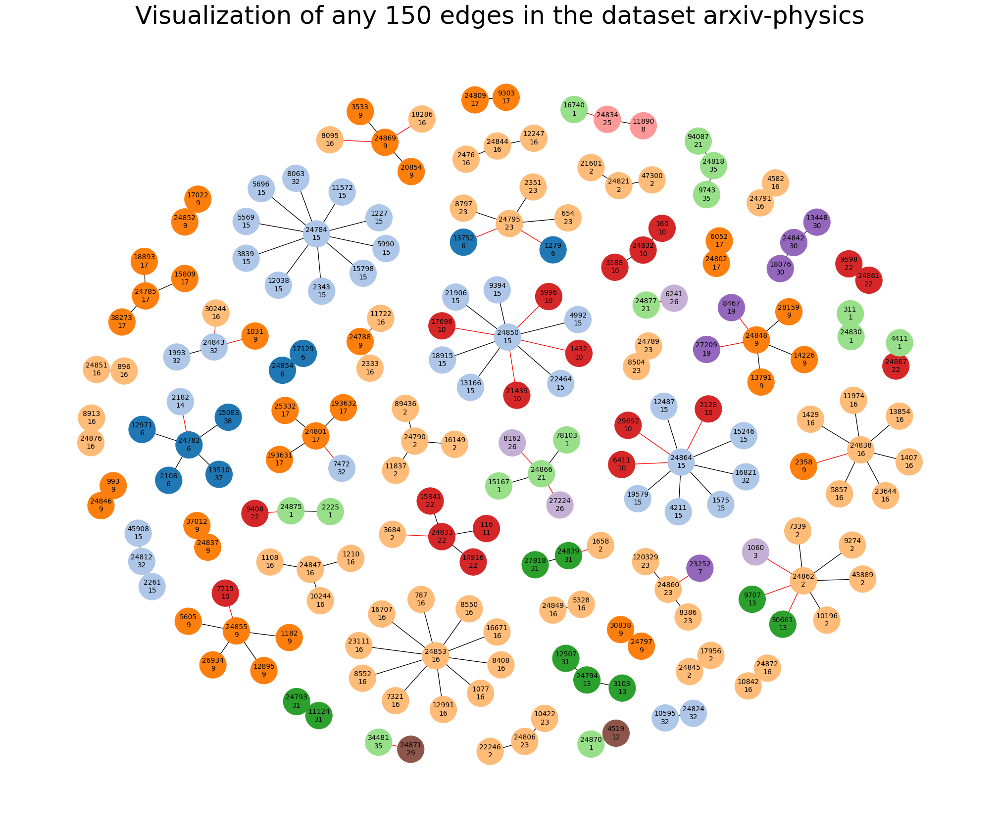

In [5]:
G = nx.Graph(customized_edge_list[20000:20150])
draw_network(G, label_num, 48)

In [ ]:
# Explore the impact of citation relationships on the prediction of paper categories

In [6]:
def citation_category(data, label_list):
    domain_statistics = [0, 0] # [0] for same domain, [1] for different domain
    for row in data:
        edge_label_1 = label_list[row[0]]
        edge_label_2 = label_list[row[1]]
        
        if edge_label_1 != edge_label_2:
            domain_statistics[1] += 1
        else:
            domain_statistics[0] += 1
    
    print("Number of same domain reference:", domain_statistics[0])
    print("Number of different domain reference:", domain_statistics[1])
    return domain_statistics

category_statistics = citation_category(edge_list, labels)

Number of same domain reference: 1071362
Number of different domain reference: 519787


<Figure size 800x600 with 0 Axes>

([<matplotlib.patches.Wedge at 0x15f31c99e10>,
 [Text(-1.0264513947607972, -0.6216088273131378, ''),
  Text(0.9409135928636377, 0.5698083982923039, '')],
 [Text(-0.5987633136104649, -0.3626051492659971, '67.3%'),
  Text(0.5132255961074387, 0.31080458088671115, '32.7%')])

(np.float64(-1.1898144921431018),
 np.float64(1.1042768670525076),
 np.float64(-1.154390741336053),
 np.float64(1.1025900353017168))

Text(0.5, 1.0, 'Same-category citations(green) vs. Different-category citations(orange)\n\nDataset Arxiv-physics')

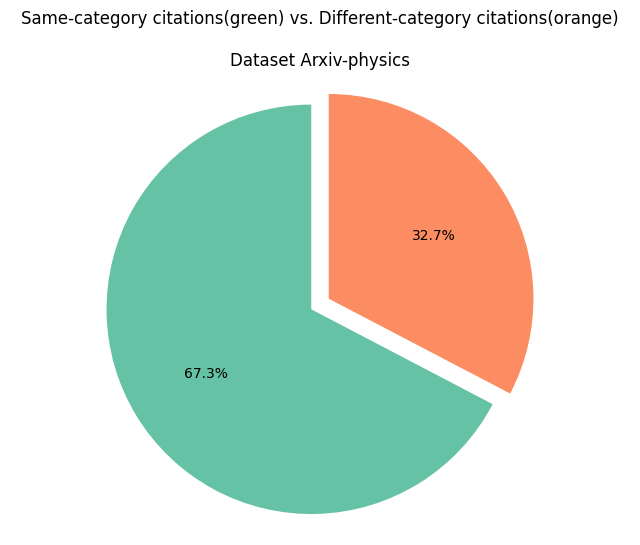

In [7]:
colors = ['#66c2a5', '#fc8d62']
explode = (0.1, 0)

# create data
plt.figure(figsize=(8, 6))
plt.pie(category_statistics, explode=explode, colors=colors,
        autopct='%1.1f%%', startangle=90)
plt.axis('equal')
plt.title('Same-category citations(green) vs. Different-category citations(orange)\n\nDataset Arxiv-physics')
plt.show()

In [8]:
def calculate_probability(item_counts):
    N = 0
    for val in item_counts.values():
        N += val
    total_combinations = N * (N - 1) / 2  # C(N, 2)
    same_class_combinations = sum(
        val * (val - 1) / 2 for val in item_counts.values() if val > 0
    )
    
    different_class_combinations = total_combinations - same_class_combinations
    
    probability_different = different_class_combinations / total_combinations
    return probability_different

def count_labels(labels):
    result = {}
    for label in labels:
        if label in result:
            result[label] += 1
        else:
            result[label] = 0
    
    return result

item_counts = count_labels(labels)
probability_different = calculate_probability(item_counts)
print("The probability that any two articles belong to the different categories:", probability_different)

The probability that any two articles belong to the different categories: 0.9547992889848372


In [ ]:
# Other explorations

In [9]:
import pandas as pd 
import numpy as np

data = pd.read_csv('./dataset/raw/paper_info.csv')
data.head()

,Title,SubmissionDate,Category,Authors
0,Moving unstable particles and special relativity,20180101,physics.gen-ph,Stefanovich Eugene V. http://orcid.org/0000-00...
1,"The graphene/n-Ge(110) interface: structure, d...",20180101,cond-mat.mtrl-sci,Tesch Julia||Paschke Fabian||Fonin Mikhail htt...
2,Enhancement of the spontaneous emission in sub...,20180101,quant-ph,Tokman Mikhail||Long Zhongqu||AlMutairi Sultan...
3,Spectroscopic study of native defects in the s...,20180101,cond-mat.mtrl-sci,Basu Raktima http://orcid.org/0000-0003-1545-8...
4,Superconductivity in electron-doped arsenene,20180101,cond-mat.supr-con,Kong Xin||Gao Miao||Yan Xun-Wang||Lu Zhong-Yi|...


   year     Category  counts
0  2018     astro-ph       6
1  2018  astro-ph.CO    1220
2  2018  astro-ph.EP    1194
3  2018  astro-ph.GA    2682
4  2018  astro-ph.HE    1898


<Figure size 1800x1300 with 0 Axes>

<Axes: xlabel='year', ylabel='counts'>

Text(0.5, 1.0, 'Publication trends in various fields of arxiv-physics (2018-2023)')

Text(0.5, 0, 'Year')

Text(0, 0.5, 'Number of published articles')

([<matplotlib.axis.XTick at 0x15f31da3f10>,
 [Text(2018, 0, '2018'),
  Text(2019, 0, '2019'),
  Text(2020, 0, '2020'),
  Text(2021, 0, '2021'),
  Text(2022, 0, '2022'),
  Text(2023, 0, '2023')])

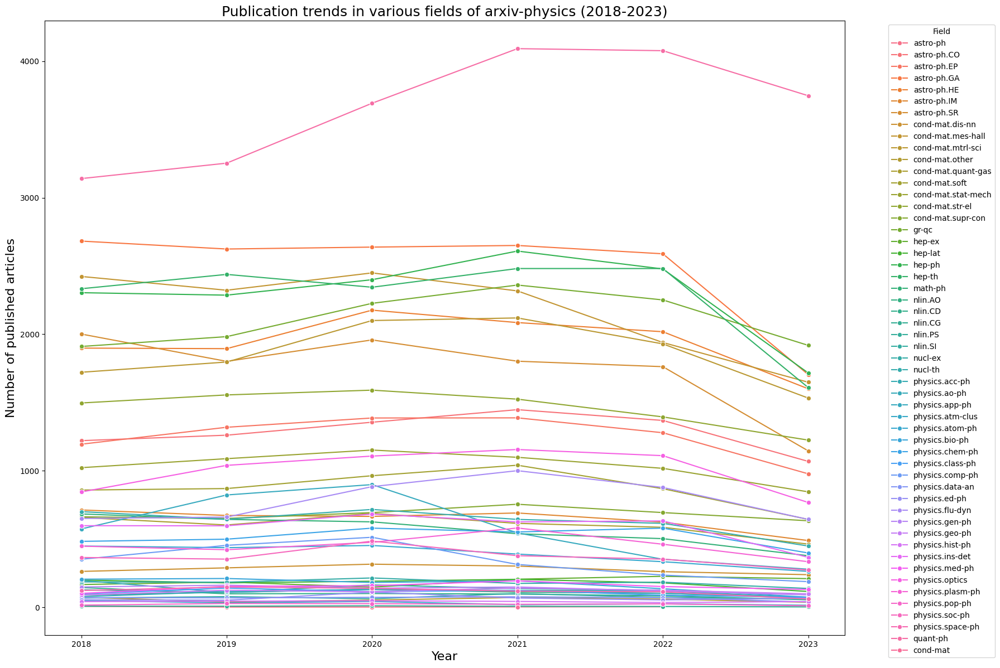

In [10]:
import matplotlib.pyplot as plt
import seaborn as sns
data['year'] = data['SubmissionDate'].astype(str).str[:4].astype(int)

# Count the number of articles in each field each year
trend_data = data.groupby(['year', 'Category']).size().reset_index(name='counts')
print(trend_data.head())

# Draw a trend chart
plt.figure(figsize=(18, 13))
sns.lineplot(data=trend_data, x='year', y='counts', hue='Category', marker='o')

plt.title('Publication trends in various fields of arxiv-physics (2018-2023)', fontsize=18)
plt.xlabel('Year', fontsize=16)
plt.ylabel('Number of published articles', fontsize=16)
plt.xticks(trend_data['year'].unique())
plt.legend(title='Field', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

In [11]:
# Get the top 10 popular fields
# Calculate the count of the value of Primary_Subclass
count_series = data['Category'].value_counts()

# Convert the count results into a DataFrame and sort
sorted_counts = count_series.sort_values(ascending=False).reset_index()
sorted_counts.columns = ['Category', 'Count']

print('Top 10 most popular subfields in physics from 2018 to 2023')
print(sorted_counts.head(10))

Top 10 most popular subfields in physics from 2018 to 2023
            Category  Count
0           quant-ph  22001
1        astro-ph.GA  14887
2             hep-ph  13792
3             hep-th  13686
4  cond-mat.mes-hall  13098
5              gr-qc  12647
6        astro-ph.HE  11671
7  cond-mat.mtrl-sci  11197
8        astro-ph.SR  10469
9    cond-mat.str-el   8783


In [ ]:
# Draw a word cloud based on the title

In [12]:
import pandas as pd
import numpy as np
import nltk
from nltk.corpus import stopwords as stps
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import requests

stopwords_list = requests.get("https://gist.githubusercontent.com/rg089/35e00abf8941d72d419224cfd5b5925d/raw/12d899b70156fd0041fa9778d657330b024b959c/stopwords.txt").content
customized_words = ["based", "field", "non"]
stopwords = set(stopwords_list.decode().splitlines() + customized_words)

# nltk.download('stopwords')
# stopwords = set(stps.words('english'))

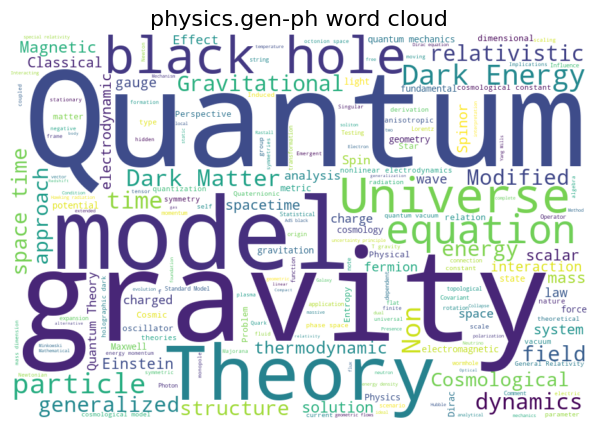

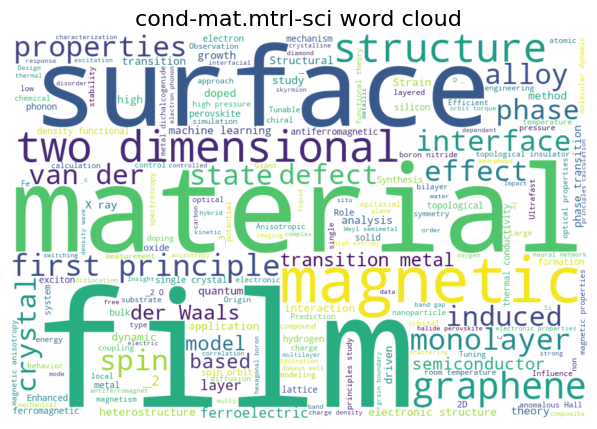

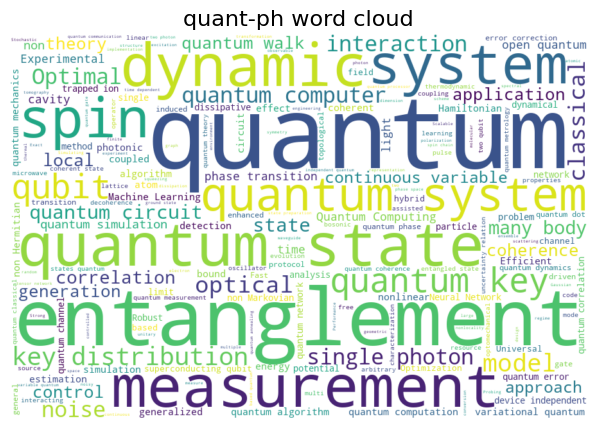

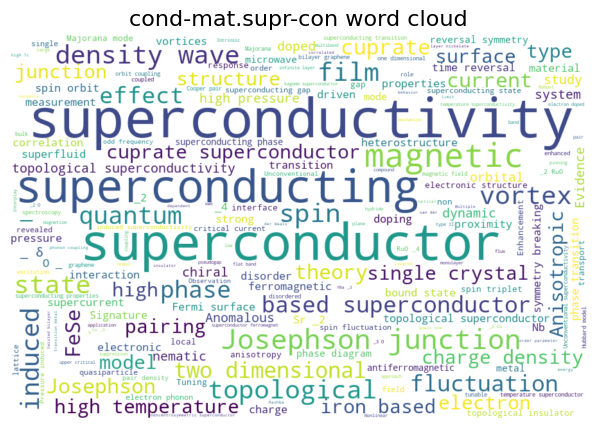

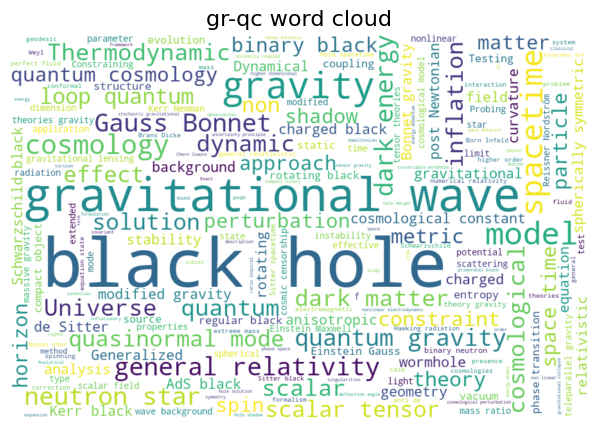

...

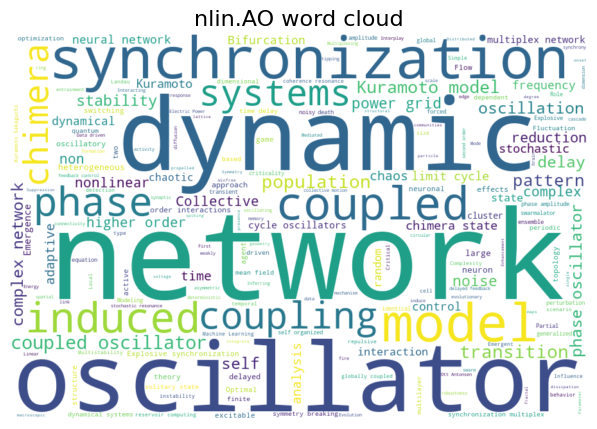

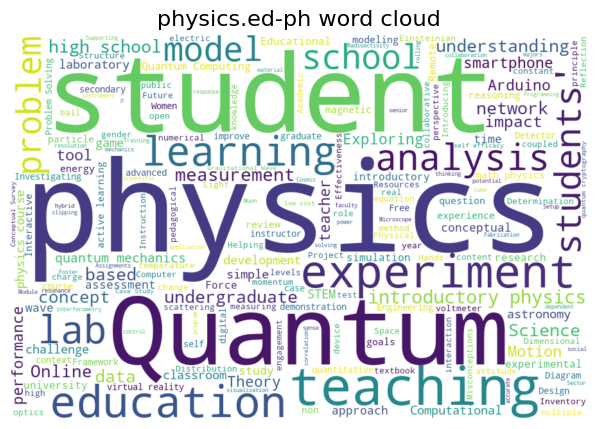

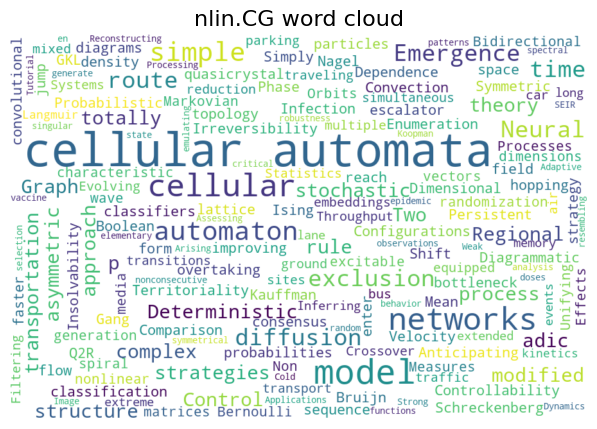

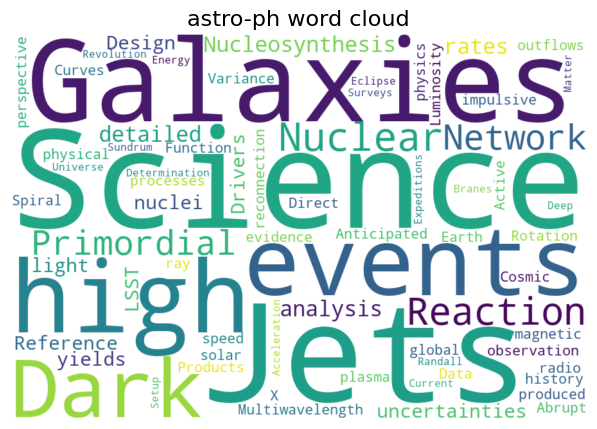

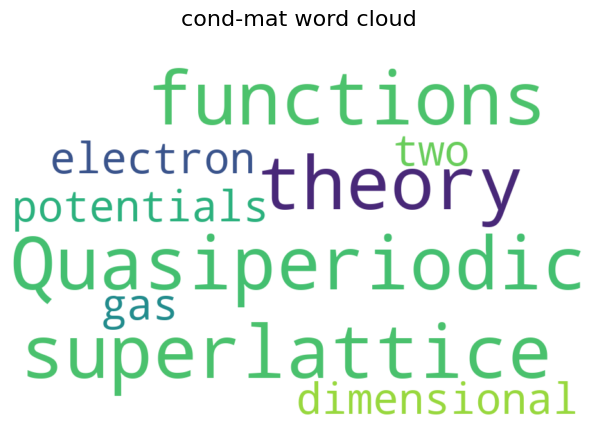

In [13]:
# Remove stop words from titles and generate word clouds
def generate_wordcloud_for_field(field):
    # Filter data for specific fields
    field_data = data[data['Category'] == field]

    # Remove stop words
    text = ' '.join(field_data['Title'].dropna())
    words = text.split()
    filtered_words = [word for word in words if word.lower() not in stopwords]
    filtered_text = ' '.join(filtered_words)
    
    # Generate word cloud
    wordcloud = WordCloud(width=900, height=600, background_color='white').generate(filtered_text)
    # wordcloud = WordCloud(width=900, height=600, background_color='white', stopwords=stopwords).generate(text)
    
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f'{field} word cloud', fontsize=16)
    plt.show()


fields = data['Category'].unique()
for field in fields:
    generate_wordcloud_for_field(field)

In [ ]:
# ogbn-arxiv dataset visualization

In [14]:
from ogb.nodeproppred import NodePropPredDataset

dataset_name = 'ogbn-arxiv'
dataset = NodePropPredDataset(name = dataset_name)
split_idx = dataset.get_idx_split()
train_idx, valid_idx, test_idx = split_idx["train"], split_idx["valid"], split_idx["test"]
ogbn_graph, ogbn_label = dataset[0] # graph: library-agnostic graph object

D:\anaconda\envs\graph\lib\site-packages\ogb\nodeproppred\dataset.py:70: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  loaded_dict = torch.load(pre_processed_file_path)


In [15]:
ogbn_label = ogbn_label.flatten().tolist()
ogbn_label_num = len(set(ogbn_label))
ogbn_label_num

40

In [16]:
ogbn_edge_list = list(zip(ogbn_graph["edge_index"][0], ogbn_graph["edge_index"][1]))
ogbn_edge_list.sort(key=lambda x: x[0])
ogbn_sorted_list = [[value[0], value[1]] for value in ogbn_edge_list]
ogbn_sorted_list[:10]

[[np.int64(0), np.int64(93487)],
 [np.int64(0), np.int64(52893)],
 [np.int64(1), np.int64(141692)],
 [np.int64(2), np.int64(168209)],
 [np.int64(2), np.int64(18735)],
 [np.int64(2), np.int64(119218)],
 [np.int64(2), np.int64(22689)],
 [np.int64(2), np.int64(50646)],
 [np.int64(2), np.int64(158293)],
 [np.int64(2), np.int64(80266)]]

In [ ]:
# Network visualization

In [17]:
def customized_ogbn_edges(data, label_list):
    edge_list = []
    for row in data:
        edge_start = str(row[0]) + '\n' + str(label_list[row[0]])
        edge_end = str(row[1]) + '\n' + str(label_list[row[1]])
        edge = (edge_start, edge_end)
        
        edge_list.append(edge)
    
    print(edge_list[:10])
    return edge_list

customized_ogbn_edge_list = customized_edges(ogbn_sorted_list, ogbn_label)

[('0\n4', '93487\n24'), ('0\n4', '52893\n24'), ('1\n5', '141692\n28'), ('2\n28', '168209\n16'), ('2\n28', '18735\n28'), ('2\n28', '119218\n28'), ('2\n28', '22689\n28'), ('2\n28', '50646\n28'), ('2\n28', '158293\n28'), ('2\n28', '80266\n28')]


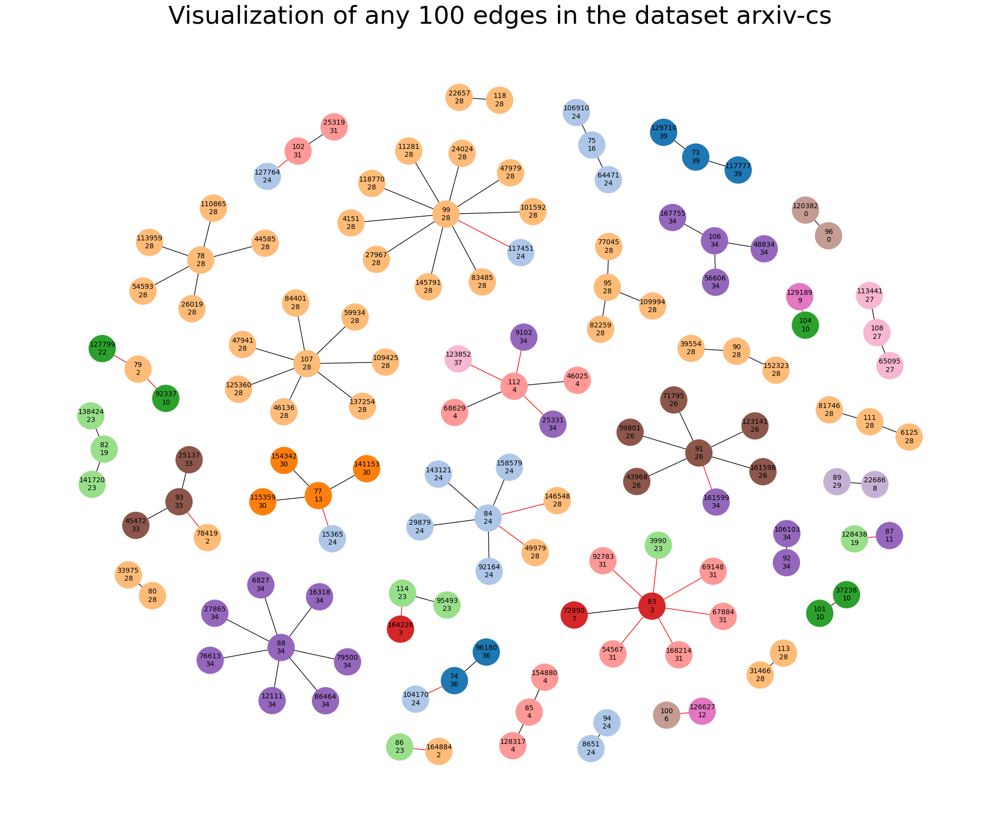

In [18]:
import networkx as nx
import matplotlib.pyplot as plt

G = nx.Graph(customized_ogbn_edge_list[200:300])
draw_network(G, ogbn_label_num, 46, "arxiv-cs")

In [ ]:
# Explore the impact of citation relationships on the prediction of paper categories

Number of same domain reference: 763986
Number of different domain reference: 402257


<Figure size 800x600 with 0 Axes>

([<matplotlib.patches.Wedge at 0x2aeb5f64dc0>,
 [Text(-0.9720077577687538, -0.5149766196997295, ''),
  Text(1.0603717823868255, 0.5617932743614744, '')],
 [Text(-0.5301860496920474, -0.28089633801803426, '65.5%'),
  Text(0.6185502063923148, 0.3277127433775267, '34.5%')])

(np.float64(-1.104418190943974),
 np.float64(1.1927824119415675),
 np.float64(-1.102340675783886),
 np.float64(1.1491569053387265))

Text(0.5, 1.0, 'Same-category citations(green) vs. Different-category citations(orange)\n\nDataset Arxiv-cs')

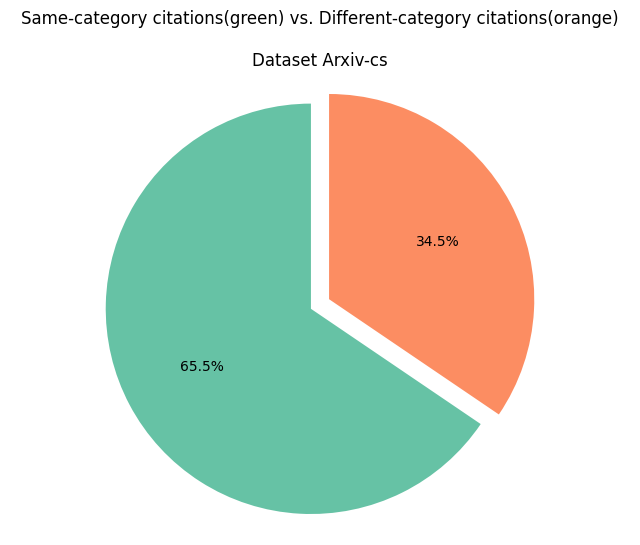

In [19]:
import matplotlib.pyplot as plt

# Defined in sell 6
category_statistics = citation_category(ogbn_edge_list, ogbn_label)
colors = ['#66c2a5', '#fc8d62']
explode = (0, 0.1)

plt.figure(figsize=(8, 6))
plt.pie(category_statistics, explode=explode, colors=colors,
        autopct='%1.1f%%', startangle=90)
plt.axis('equal')
plt.title('Same-category citations(green) vs. Different-category citations(orange)\n\nDataset Arxiv-cs')
plt.show()